# Imports

In [12]:
from PIL import Image
from PIL import ImageFilter
from matplotlib import pyplot as plt
from PIL import ImageEnhance
import numpy as np

# Actual Stuff

In [52]:
class Picture:

    def __init__(self, path):
        self.img = Image.open(path)
        self.path = path
        self.original_image = self.img
        self._thread = [self.img]
        self._amplified = False

    def show(self):
        plt.figure()
        plt.axis('off')
        plt.imshow(self.img)

    def back(self):
        if(len(self._thread)>0):
            self._thread.pop()
            self.img = self._thread[-1]

    def amplify_edges(self):
        self.img = self.img.filter(ImageFilter.EDGE_ENHANCE)
        self._thread.append(self.img)

    def blur(self):
        self.img = self.img.filter(ImageFilter.BLUR)
        self._thread.append(self.img)

    def smooth(self):
        ImageFilter(self.img).filter()
        self.img = self.img.filter(ImageFilter.SMOOTH)
        self._thread.append(self.img)

    def increase_color(self, color=1.5):
        self.img = ImageEnhance.Color(self.img).enhance(color)
        self._thread.append(self.img)

    def increase_contrast(self, contrast=1.4):
        self.img = ImageEnhance.Contrast(self.img).enhance(contrast)
        self._thread.append(self.img)

    def sharpen(self, sharpen=3):
        self.img = ImageEnhance.Sharpness(self.img).enhance(sharpen)
        self._thread.append(self.img)

    def brighten(self, brighten=1.1):
        self.img = ImageEnhance.Brightness(self.img).enhance(brighten)
        self._thread.append(self.img)

    def darken(self, darken=0.9):
        self.img = ImageEnhance.brighten(self.img).enhance(darken)
        self._thread.append(self.img)

    def random_edits(self):
        self.img = self.original_image
        self.brighten(np.random.normal(1, 0.1))
        self.sharpen()
        self.increase_color(np.random.normal(1.5, 0.2))
        self.increase_contrast(np.random.normal(1.4, 0.25))
        if(np.random.randint(4) == 0):
            self.amplify_edges()
        if(np.random.randint(20) == 0):
            self.blur()
        if(np.random.randint(4) == 0):
            self.smooth()
        self._thread.append(self.img)

    def auto_enhance(self):
        self.img = self.original_image
        self.sharpen()
        self.increase_color()
        self.brighten()
        self._thread.append(self.img)

In [53]:
stuff = ! ls ../Enhance/
stuff

['Team MSDS Frisbee.png',
 'Team MSDS Soccer.jpg',
 'beanie dog.jpg',
 'bebe me.PNG',
 'bradshaw road.PNG',
 'cat what.jpg',
 'connor+patricia.jpg',
 'dark beach.JPG',
 'dark dock.JPG',
 'dog chews heart.jpg',
 'gg bridge night.JPG',
 'nfs carbon.JPG',
 'nfs hp2.JPG',
 'ocean.JPG',
 'porkchop.JPG',
 'rainbow.JPG',
 'trini downtown.JPG',
 'trini flag closer.JPG',
 'trini flag.JPG',
 'warriors.JPG',
 'with mom in water.JPG']

/var/folders/dc/vmrx_nc16tz65xmfmz0x56kh0000gn/T/ipykernel_66545/171749646.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


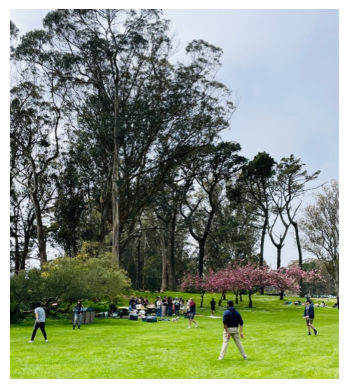

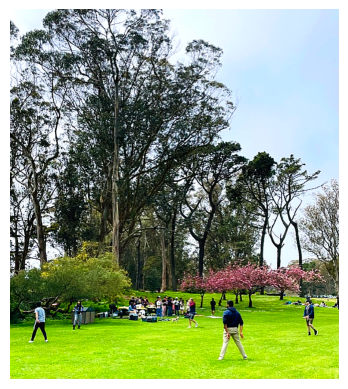

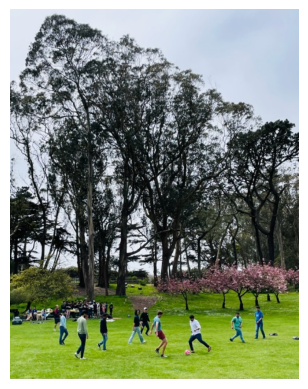

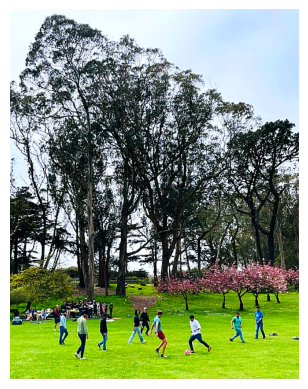

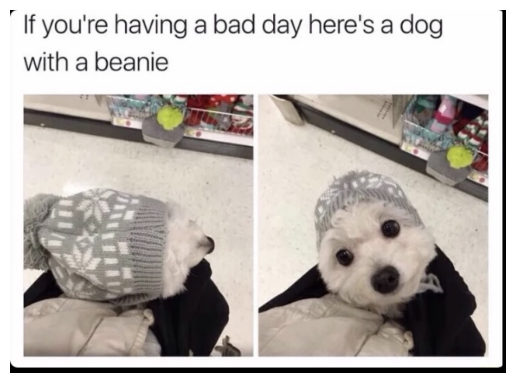

...

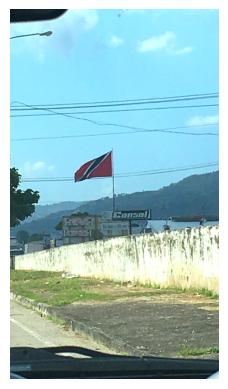

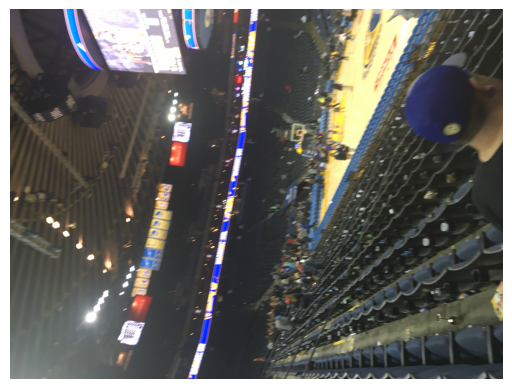

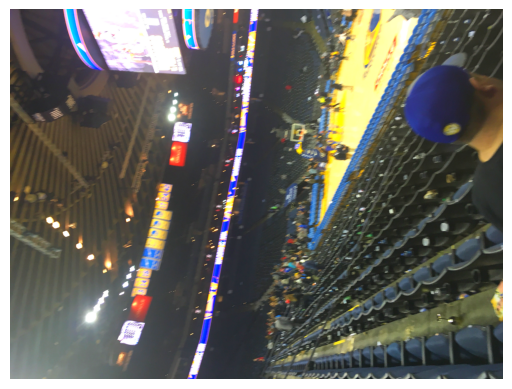

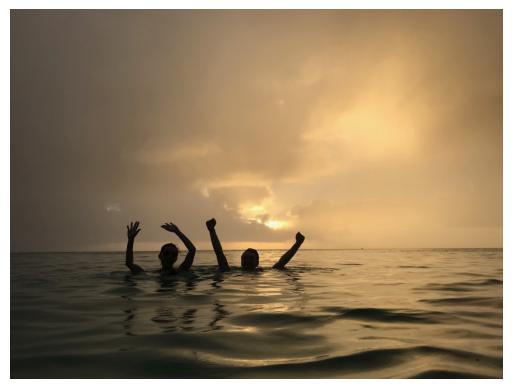

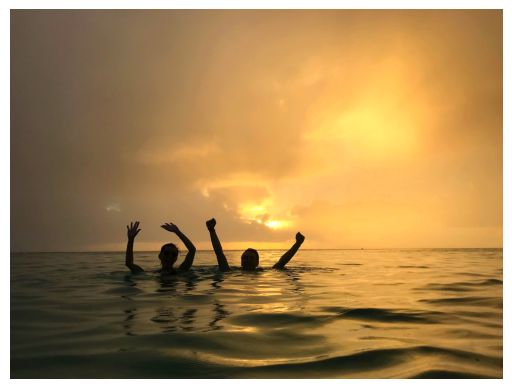

In [54]:
for link in stuff:
    pic = Picture(f'../Enhance/{link}')
    pic.show()
    pic.auto_enhance()
    pic.show()